In [19]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In RL, a state is an observation that passes estimable information to the agent. By analyzing the information, an agent makes an optimal move based on its policy. States can be both finite or infinite. 

We created our own virtual environment using tensorflow. In the setup, the sate is used to analyse the accuracy of the model based a deep learning model. The deeplearning model is constructed associated with TDA.
        That is during the trainning and the testing of the model, we take into account the shape of the dataset. We are trying to discriminate different classes. 
        
Let's say we want to train an agent for the model:

At every turn the agent can do 2 things: run the model , or stop the current round.
The goal is to make sure that the previous loss is greater than the new loss for the trainning set(this means the shape is conserved).
An environment that represents what we are trying to implement could look like this:

Actions: We have 2 actions. Action 0: run the model, and Action 1: terminate the current round.
Observations: loss of the testing dataset at epoch n should be less than that at n-1
Reward: The objective is to the best accuracy of the test data set.

In [2]:
from utilities import *

I am in libs


In [3]:
%store -r x_scaled
%store -r Y

In [4]:
x_scaled.columns.shape

(40,)

In [5]:
Y.columns

Index(['mortalité dans le premier séjour réanimation', 'mortalité à J30',
       'mortalité à 90j', 'mortalité à un an', 'target'],
      dtype='object')

In [6]:
X_train, X_test, y_train, y_test = train_test_split(x_scaled, Y['mortalité à un an'], test_size=0.20, random_state=42, stratify=Y['mortalité à un an'])


In [7]:
len(y_test)

51

In [8]:
#converting fromnumpy to torch tensor
X_train = torch.FloatTensor(X_train.to_numpy())
X_test = torch.FloatTensor(X_test.to_numpy())
y_train = torch.LongTensor(y_train.to_numpy())
y_test = torch.LongTensor(y_test.to_numpy())

In [29]:
#"constructing our model"
class Model(nn.Module):
    def __init__(self,input_dim,output_dim):
        super(Model,self).__init__()
        self.input_layer    = nn.Linear(input_dim,128)
        self.hidden_layer1  = nn.Linear(128,64)
        self.output_layer   = nn.Linear(64,output_dim)
        self.relu = nn.ReLU()
    
    
    def forward(self,x):
        out =  self.relu(self.input_layer(x))
        out =  self.relu(self.hidden_layer1(out))
        hidden = out
        out =  self.output_layer(out)
        return out,hidden

In [30]:
persistence = VietorisRipsPersistence(metric = 'euclidean',homology_dimensions=[0,1,2],n_jobs=-1,collapse_edges=True)

def eachEpoch(epoch, train_losses,test_losses):
    optimizer.zero_grad()
        
    #forward feed
    y,output_train = model(X_train)

    

    #transforming my input dataset into a 3d array and calcualting it persistence entropy
    dx=persistence.fit_transform(X_train[None,:,:])
    #calculating the amplitude
    a1=Amplitude(metric='bottleneck').fit_transform(dx)
    a2=Amplitude(metric='wasserstein').fit_transform(dx)
    a3=Amplitude(metric='landscape').fit_transform(dx)
    a4=Amplitude(metric='betti').fit_transform(dx)
    a5=Amplitude(metric='persistence_image').fit_transform(dx)

    a=a1+a2+a3+a4+a5
    
    #print(output_train.detach().numpy())
    #same for output y
    dy=persistence.fit_transform(output_train.detach().numpy()[None,:,:])
    b1=Amplitude(metric='bottleneck').fit_transform(dy)
    b2=Amplitude(metric='wasserstein').fit_transform(dy)
    b3=Amplitude(metric='landscape').fit_transform(dy)
    b4=Amplitude(metric='betti').fit_transform(dy)
    b5=Amplitude(metric='persistence_image').fit_transform(dy)

    b=b1+b2+b3+b4+b5
    
    l=(np.linalg.norm(a-b)**2)/2
    

    #calculate the loss
    loss_train = criterion(y, y_train)+(1e-6)*l

    #backward propagation: calculate gradients
    loss_train.backward()

    #update the weights
    optimizer.step()


    pred_test,output_test = model(X_test)
    loss_test = criterion(pred_test,y_test)

    train_losses[epoch] = loss_train.item()
    test_losses[epoch] = loss_test.item()
    
    y_pred = torch.argmax(pred_test, dim=1)
    correct = (y_pred == y_test).sum().item()
    accuracy = correct / len(y)
    pred_test = pred_test.detach().numpy()
    result.append(pred_test)

    if epoch % 10 == 0:
    #print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {loss_train.item():.4f}, Test Loss: {loss_test.item():.4f}")
        print(f"Epoch {epoch}, Train Loss: {loss_train.item():.4f}, Test Loss: {loss_test.item():.4f}")

    return [epoch + 1,loss_test.item()]
    

In [31]:
from tf_agents.environments import py_environment
from tf_agents.environments import tf_environment
from tf_agents.environments import tf_py_environment
from tf_agents.environments import utils
from tf_agents.specs import array_spec
from tf_agents.environments import wrappers
from tf_agents.environments import suite_gym
from tf_agents.trajectories import time_step as ts

class TDAEnv(py_environment.PyEnvironment):

  def __init__(self):
    self._action_spec = array_spec.BoundedArraySpec(
        shape=(), dtype=np.int32, minimum=0, maximum=1, name='action')
    self._observation_spec = array_spec.BoundedArraySpec(
        shape=(1,), dtype=np.int32, minimum=0, maximum=1, name='observation')
    self._state = 1
    self._epoch = 0
    self._episode_ended = False

  def action_spec(self):
    return self._action_spec

  def observation_spec(self):
    return self._observation_spec

  def _reset(self):
    self._state = 1
    self._episode_ended = False
    return ts.restart(np.array([self._state], dtype=np.int32))

  def _step(self, action):
    if self._episode_ended:
      # The last action ended the episode. Ignore the current action and start
      # a new episode.
      return self.reset()

    # Make sure episodes don't go on forever.
    if action == 1:
      self._episode_ended = True
    elif action == 0:
        #add annimation function here
        #calculate the accuracy and send it to state
      self._epoch,accu = eachEpoch(self._epoch,train_losses,test_losses)
        #increasing the state by 1, which is our observation because we are making 
        #sure that the epoch should  ot be greater than a certain value
      tmp_state = self._state 
      self._state = accu
    else:
      raise ValueError('`action` should be 0 or 1.')

    #the state here precise the number of epochs
    #print("testing ",self._state > tmp_state,self._state , tmp_state)
    if self._episode_ended or  self._state > tmp_state:
      
      reward = 0
      return ts.termination(np.array([self._state], dtype=np.int32), reward)
    else:
        #if self._state >= 86:
         # return ts.transition(
          #    np.array([self._state], dtype=np.int32), reward=1.0, discount=1.0)
        #else:
         #   return ts.transition(
          #    np.array([self._state], dtype=np.int32), reward=0.0, discount=1.0)
        return ts.transition(
            np.array([self._state], dtype=np.int32), reward=1.0, discount=1.0)


In [32]:
# input_dim = 40 because we have 40 inputs 
# output_dim = 2 because we have namely 2 categories dead or alive
input_dim  = 40 
output_dim = 2
model = Model(input_dim,output_dim)

In [33]:
# creating our optimizer and loss function object
learning_rate = 0.0001
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(),lr=learning_rate)

In [34]:
#environment = TDAEnv()

In [35]:
#utils.validate_py_environment(environment, episodes=6)
num_epochs = 1000
train_losses = np.zeros(num_epochs)
test_losses  = np.zeros(num_epochs)

In [36]:
fig, ax = plt.subplots()
result = []
get_new_action = np.array(0, dtype=np.int32)
end_round_action = np.array(1, dtype=np.int32)

environment = TDAEnv()
time_step = environment.reset()
print(time_step)
time_step = environment.step(get_new_action)
cumulative_reward = time_step.reward
print(time_step)


while time_step.reward !=0:
  time_step = environment.step(get_new_action)
  #print(time_step)
  cumulative_reward += time_step.reward
plt.close()
print('Final Reward = ', cumulative_reward)

TimeStep(
{'discount': array(1., dtype=float32),
 'observation': array([1]),
 'reward': array(0., dtype=float32),
 'step_type': array(0)})
Epoch 0, Train Loss: 0.7798, Test Loss: 0.7584
TimeStep(
{'discount': array(1., dtype=float32),
 'observation': array([0]),
 'reward': array(1., dtype=float32),
 'step_type': array(1)})
Epoch 10, Train Loss: 0.7588, Test Loss: 0.7384
Epoch 20, Train Loss: 0.7395, Test Loss: 0.7187
Epoch 30, Train Loss: 0.7215, Test Loss: 0.6993
Epoch 40, Train Loss: 0.7040, Test Loss: 0.6803
Epoch 50, Train Loss: 0.6877, Test Loss: 0.6610
Epoch 60, Train Loss: 0.6709, Test Loss: 0.6416
Epoch 70, Train Loss: 0.6527, Test Loss: 0.6223
Epoch 80, Train Loss: 0.6345, Test Loss: 0.6031
Epoch 90, Train Loss: 0.6166, Test Loss: 0.5838
Epoch 100, Train Loss: 0.5987, Test Loss: 0.5650
Epoch 110, Train Loss: 0.5798, Test Loss: 0.5467
Epoch 120, Train Loss: 0.5620, Test Loss: 0.5292
Epoch 130, Train Loss: 0.5451, Test Loss: 0.5128
Epoch 140, Train Loss: 0.5303, Test Loss: 0.497

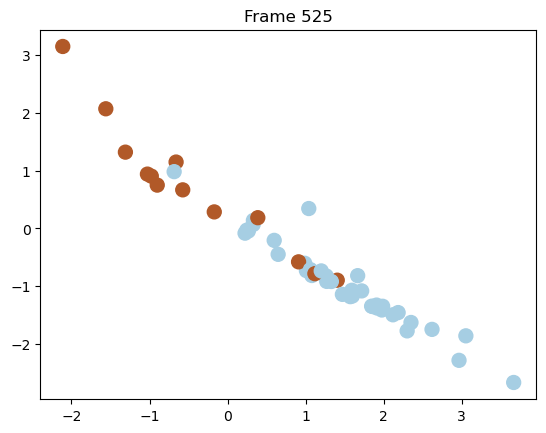

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation


# Create a figure and axis
fig, ax = plt.subplots()
ims = []

# Function to update the scatter plot for each frame
def update(frame):
    ax.clear()
    res = np.array(result[frame])
    im = ax.scatter(res[:, 0], res[:, 1], c=y_test, cmap=plt.cm.Paired, s=100)
    ax.set_title(f'Frame {frame + 1}')
    ims.append([im])

# Create the animation
ani = FuncAnimation(fig, update, frames=len(result), repeat=False)

HTML(ani.to_jshtml())


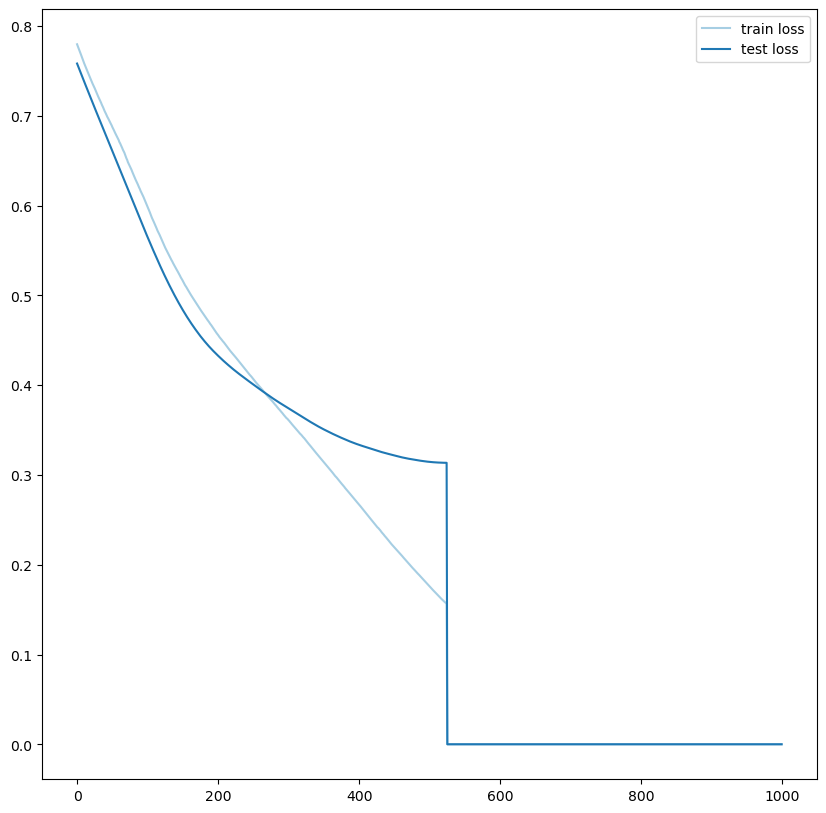

In [38]:
plt.figure(figsize=(10,10))
plt.plot(train_losses, label='train loss')
plt.plot(test_losses, label='test loss')
plt.legend()
plt.show()

In [39]:
predictions_train = []
predictions_test =  []
with torch.no_grad():
    predictions_train,u = model(X_train)
    predictions_test,t = model(X_test)

In [40]:
# Get the class with the highest probability as the prediction
predictions_train = torch.argmax(predictions_train, dim=1)
predictions_test = torch.argmax(predictions_test, dim=1)

In [41]:
print("Training Recall:", round(recall_score(predictions_train, y_train, pos_label=0)*100,4))
print("Training Precision:",
     round(precision_score(predictions_train, y_train, pos_label=0)*100,4))
print("Training F1-score:",
          round(f1_score(predictions_train, y_train, pos_label=0)*100,4))

Training Recall: 96.1783
Training Precision: 100.0
Training F1-score: 98.0519


In [42]:
print("Testing Recall:", round(recall_score(predictions_test, y_test, pos_label=0)*100,4))
print("Testing Precision:",
     round(precision_score(predictions_test, y_test, pos_label=0)*100,4))
print("Testing F1-score:",
          round(f1_score(predictions_test, y_test, pos_label=0)*100,4))

Testing Recall: 90.2439
Testing Precision: 97.3684
Testing F1-score: 93.6709


In [43]:
report = classification_report(predictions_test, y_test)
print(report)

              precision    recall  f1-score   support

           0       0.97      0.90      0.94        41
           1       0.69      0.90      0.78        10

    accuracy                           0.90        51
   macro avg       0.83      0.90      0.86        51
weighted avg       0.92      0.90      0.91        51



              precision    recall  f1-score   support

           0       0.97      0.90      0.94        41
           1       0.69      0.90      0.78        10

    accuracy                           0.90        51
   macro avg       0.83      0.90      0.86        51
weighted avg       0.92      0.90      0.91        51

Training Recall: 0.9024
Training Precision: 0.9737
Training F1-score: 0.9367


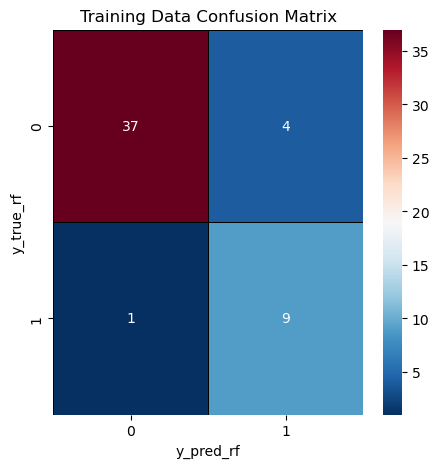

In [44]:
classification_results(None,predictions_test,y_test,None)